In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import missingno as msno
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
import seaborn as sns
import warnings
from sklearn.datasets import make_classification
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier

warnings.filterwarnings("ignore")

## Data

In [3]:
df = pd.read_csv('dataset.csv')
df = df.drop(['Unnamed: 83','encounter_id','patient_id','hospital_id','icu_id'],axis = 1)
df.head()

,age,bmi,elective_surgery,ethnicity,gender,height,icu_admit_source,icu_stay_type,icu_type,pre_icu_los_days,...,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,hospital_death
0,68.0,22.73,0,Caucasian,M,180.3,Floor,admit,CTICU,0.541667,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular,0
1,77.0,27.42,0,Caucasian,F,160.0,Floor,admit,Med-Surg ICU,0.927778,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory,0
2,25.0,31.95,0,Caucasian,F,172.7,Accident & Emergency,admit,Med-Surg ICU,0.000694,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic,0
3,81.0,22.64,1,Caucasian,F,165.1,Operating Room / Recovery,admit,CTICU,0.000694,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular,0
4,19.0,NaN,0,Caucasian,M,188.0,Accident & Emergency,admit,Med-Surg ICU,0.073611,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma,0


In [4]:
df.shape

(91713, 80)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91713 entries, 0 to 91712
Data columns (total 80 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   age                            87485 non-null  float64
 1   bmi                            88284 non-null  float64
 2   elective_surgery               91713 non-null  int64  
 3   ethnicity                      90318 non-null  object 
 4   gender                         91688 non-null  object 
 5   height                         90379 non-null  float64
 6   icu_admit_source               91601 non-null  object 
 7   icu_stay_type                  91713 non-null  object 
 8   icu_type                       91713 non-null  object 
 9   pre_icu_los_days               91713 non-null  float64
 10  weight                         88993 non-null  float64
 11  apache_2_diagnosis             90051 non-null  float64
 12  apache_3j_diagnosis            90612 non-null 

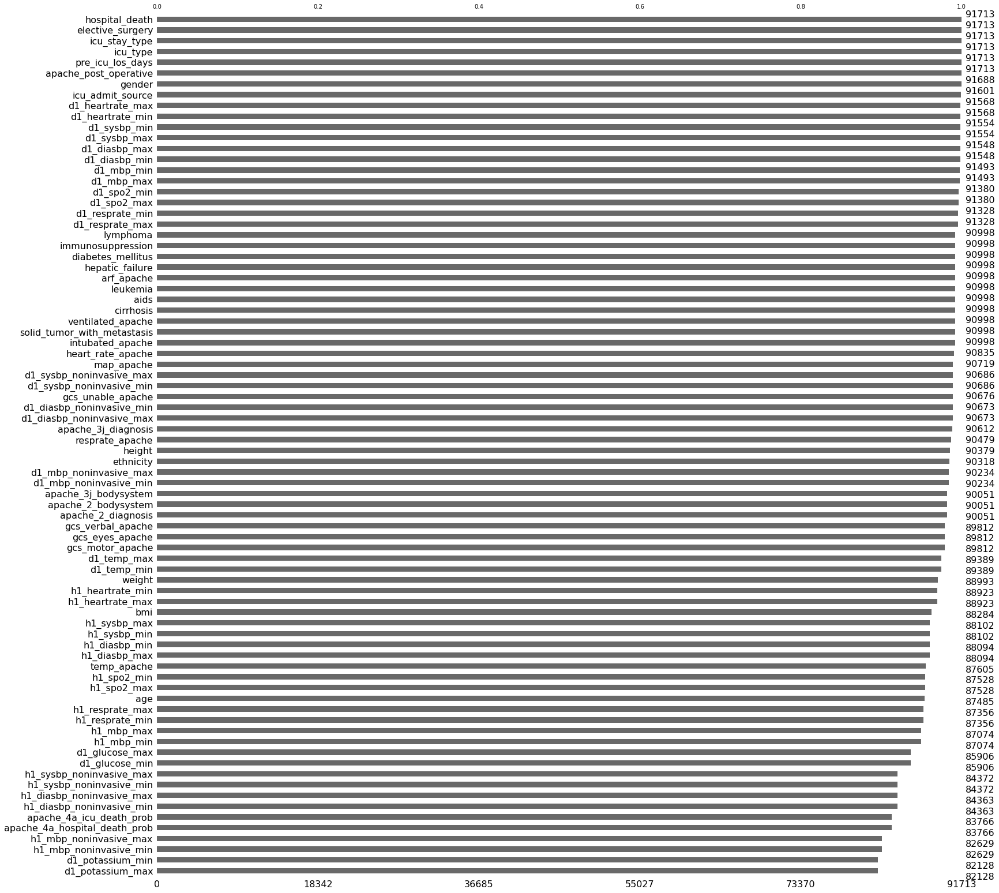

In [6]:
msno.bar(df, sort='ascending')
plt.show()

## Data Cleaning

In [7]:
def fill_missing_values(df):
    for column in df.columns:
        if df[column].dtype == 'object':
            df[column].fillna(df[column].mode()[0], inplace=True)
        else:
            df[column].fillna(df[column].mean(), inplace=True)
    return df

In [8]:
df_filled = fill_missing_values(df)

Imputed missing values with mean and mode

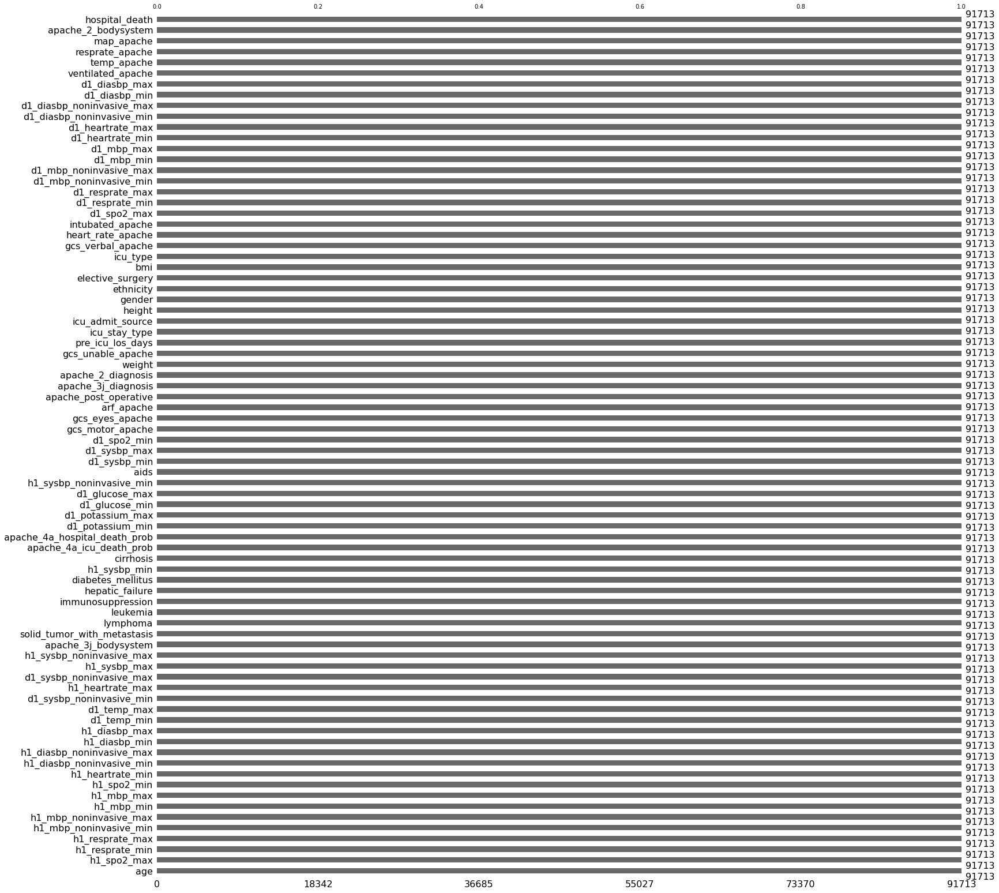

In [9]:
msno.bar(df_filled,sort = 'ascending')
plt.show()

## Data Analysis

#### Summary statistics for numerical variables:

In [10]:
df_filled.describe()

,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,...,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,hospital_death
count,91713.000000,91713.000000,91713.000000,91713.000000,91713.000000,91713.000000,91713.000000,91713.000000,91713.000000,91713.000000,...,91713.000000,91713.000000,91713.000000,91713.000000,91713.000000,91713.000000,91713.000000,91713.000000,91713.000000,91713.000000
mean,62.309516,29.185818,0.183736,169.641588,0.835766,84.028340,185.401739,558.216377,0.201106,0.027979,...,0.043955,0.000857,0.015693,0.225192,0.012989,0.026165,0.007066,0.004132,0.020638,0.086302
std,16.383883,8.118970,0.387271,10.716578,2.487756,24.637809,85.267612,460.477835,0.400829,0.164268,...,0.207712,0.029151,0.123799,0.416079,0.112786,0.159004,0.083436,0.063897,0.141614,0.280811
min,16.000000,14.844926,0.000000,137.200000,-24.947222,38.600000,101.000000,0.010000,0.000000,0.000000,...,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,53.000000,23.787760,0.000000,162.560000,0.035417,67.300000,113.000000,203.010000,0.000000,0.000000,...,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,64.000000,28.007812,0.000000,170.000000,0.138889,81.400000,123.000000,410.010000,0.000000,0.000000,...,0.030000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,75.000000,32.653061,0.000000,177.800000,0.409028,96.300000,301.000000,703.030000,0.000000,0.000000,...,0.060000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,89.000000,67.814990,1.000000,195.590000,159.090972,186.000000,308.000000,2201.050000,1.000000,1.000000,...,0.970000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


#### Target Variable Distribution

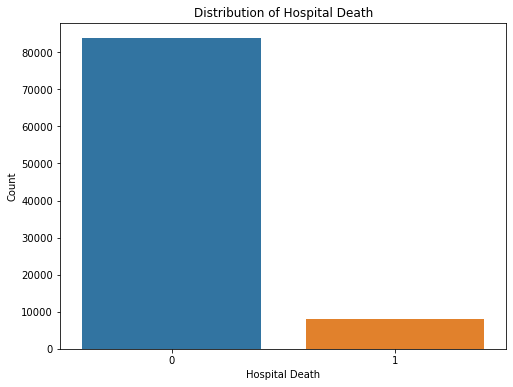

In [11]:
plt.figure(figsize=(8, 6))
sns.countplot(x='hospital_death', data=df_filled)
plt.title('Distribution of Hospital Death')
plt.xlabel('Hospital Death')
plt.ylabel('Count')
plt.show()

#### Frequency Analysis and plots

In [12]:
print("\nFrequencies of categorical variables:")
for column in df_filled.select_dtypes(include='object').columns:
    print('------------------------------------------------')
    print(df_filled[column].value_counts())
    print('------------------------------------------------')


Frequencies of categorical variables:
------------------------------------------------
Caucasian           72079
African American     9547
Other/Unknown        4374
Hispanic             3796
Asian                1129
Native American       788
Name: ethnicity, dtype: int64
------------------------------------------------
------------------------------------------------
M    49494
F    42219
Name: gender, dtype: int64
------------------------------------------------
------------------------------------------------
Accident & Emergency         54172
Operating Room / Recovery    18713
Floor                        15611
Other Hospital                2358
Other ICU                      859
Name: icu_admit_source, dtype: int64
------------------------------------------------
------------------------------------------------
admit       86183
transfer     4970
readmit       560
Name: icu_stay_type, dtype: int64
------------------------------------------------
----------------------------------

In [13]:
categorical_columns = df_filled.select_dtypes(include='object').columns
categorical_columns

Index(['ethnicity', 'gender', 'icu_admit_source', 'icu_stay_type', 'icu_type',
       'apache_3j_bodysystem', 'apache_2_bodysystem'],
      dtype='object')

In [14]:
for column in categorical_columns:
    fig = px.bar(df_filled[column].value_counts(), 
                 labels={'value': 'Frequency', 'index': column},
                 title=f'Frequency of {column}',
                 template='plotly',
                 color=df_filled[column].value_counts().index,
                 color_discrete_sequence=px.colors.qualitative.Pastel)
    fig.update_traces(marker_line_color='rgb(8,48,107)', marker_line_width=1.5, opacity=0.8)
    fig.update_layout(hovermode='closest', hoverlabel=dict(bgcolor="white", font_size=12, font_family="Rockwell"))
    fig.show()

#### Correlation Analysis

In [15]:
corr_matrix = df_filled.corr()

heatmap = go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    colorscale='Viridis',
    colorbar=dict(title='Correlation'),
)

layout = go.Layout(
    title='Correlation Matrix',
    xaxis=dict(title='Features', tickangle=-45),
    yaxis=dict(title='Features'),
    width=1000, 
    height=1000,
)

fig = go.Figure(data=[heatmap], layout=layout)
fig.show()

#### Relationships between numerical variables and the target variable

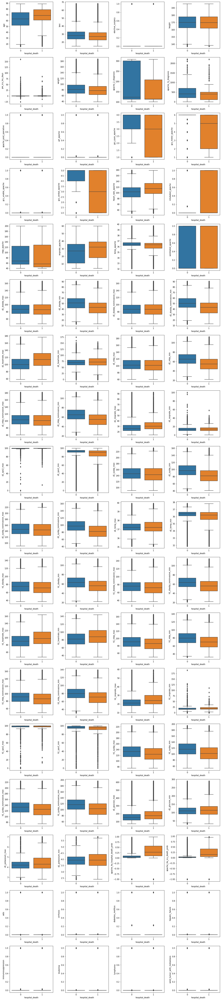

In [16]:
num_cols = df_filled.drop('hospital_death',axis = 1).select_dtypes(include=['float64', 'int64']).shape[1]

# Define the subplot configuration based on the number of numerical columns
num_rows = (num_cols // 4) + 1 if num_cols % 4 != 0 else num_cols // 4
num_cols = min(num_cols, 4)

# Create subplots for box plots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 4 * num_rows))

# Flatten the axes array if it's a single row
if num_rows == 1:
    axes = axes.reshape(1, -1)

# Plot box plots for each numerical column
for i, column in enumerate(df_filled.drop('hospital_death',axis = 1).select_dtypes(include=['float64', 'int64']).columns):
    sns.boxplot(x='hospital_death', y=column, data=df_filled, ax=axes[i // 4, i % 4])

# Remove empty subplots
for j in range(i + 1, num_rows * num_cols):
    axes[j // 4, j % 4].axis('off')

# Adjust layout and display plot
plt.tight_layout()
plt.show()

In [17]:
fig = px.histogram(df_filled[['age','gender','hospital_death','bmi']].dropna(), x="age", y="hospital_death", color="gender",
                   marginal="box", # or violin, rug
                   hover_data=df_filled[['age','gender','hospital_death','bmi']].columns)
fig.show()


In [18]:
age_death_F = df_filled[df_filled['gender'] == 'F'][['age', 'hospital_death']].groupby('age').mean().reset_index()
age_death_M = df_filled[df_filled['gender'] == 'M'][['age', 'hospital_death']].groupby('age').mean().reset_index()

fig = make_subplots()
fig.add_trace(
    go.Scatter(x=age_death_F['age'], y=age_death_F['hospital_death'], name="Female patients"),
)
fig.add_trace(
    go.Scatter(x=age_death_M['age'], y=age_death_M['hospital_death'], name="Male patients"),
)
fig.update_layout(
    title_text="<b>Average hospital death probability of patients<b>",
    xaxis_title="<b>patient age<b>",
    yaxis_title="<b>Average Hospital Death</b>",
    showlegend=True,
)
fig.show()

In [19]:
weight_df = df_filled[['weight', 'hospital_death', 'bmi']]
weight_df['weight'] = weight_df['weight'].round(0)
weight_df['bmi'] = weight_df['bmi'].round(0)

weight_death = weight_df[['weight', 'hospital_death']].groupby('weight').mean().reset_index()
bmi_death = weight_df[['bmi', 'hospital_death']].groupby('bmi').mean().reset_index()
fig = make_subplots(rows=1, cols=2, shared_yaxes=True)
fig.add_trace(
    go.Scatter(x=weight_death['weight'], y=weight_death['hospital_death'], name="Weight"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=bmi_death['bmi'], y=bmi_death['hospital_death'], name="BMI"),
    row=1, col=2
)
fig.update_layout(
    title_text="<b>Impacts of BMI and Weight on Patients<b>",
    xaxis_title="<b>Weight (kg)<b>",
    yaxis_title="<b>Average Hospital Death<b>",
    showlegend=True,
)
fig.show()

In [20]:
ICU_type = df_filled[['icu_type', 'age', 'hospital_death']]
ICU_type['icu_type'] = ICU_type['icu_type'].replace({'CTICU': 'CCU-CTICU',
                                                     'Cardiac ICU': 'CCT-CTICU',
                                                     'CTICU': 'CCT-CTICU',
                                                     'CSICU': 'SICU'})

ICU_df = ICU_type.groupby(['icu_type', 'age']).mean().reset_index()
ICU_df['count'] = ICU_type.groupby(['icu_type', 'age']).count().reset_index()['hospital_death']

fig = px.scatter(ICU_df, x="age", y="hospital_death", size="count", color="icu_type",
                 hover_name="icu_type", log_x=False, size_max=60)
fig.update_layout(
    title_text="<b>Survival rate at different types of ICU<b>",
    xaxis_title="<b>Age<b>",
    yaxis_title="<b>Average Hospital Death<b>"
)
fig.show()

In [21]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

apache3 = df_filled[['age', 'apache_3j_bodysystem', 'hospital_death']]
apache3 = apache3.groupby(['apache_3j_bodysystem', 'age']).agg(['size', 'mean']).reset_index()

apache3['size'] = apache3['hospital_death']['size']
apache3['mean'] = apache3['hospital_death']['mean']

apache3.drop('hospital_death', axis=1, inplace=True)

systems = list(apache3['apache_3j_bodysystem'].unique())

for s in systems:
    mask = apache3['apache_3j_bodysystem'] == s
    data = []
    list_updatemenus = []

    trace = dict(
        x=apache3.loc[mask, 'age'],
        y=apache3.loc[mask, 'mean'],
        mode='markers',
        marker={'size': apache3.loc[mask, 'size'] / apache3.loc[mask, 'size'].sum() * 1000,
                'color': apache3.loc[mask, 'mean'],
                'showscale': True}
    )
    data.append(trace)

    layout = dict(
        xaxis=dict(title='<b>Age<b>', range=[min(apache3.loc[mask, 'age']) - 10, max(apache3.loc[mask, 'age']) + 10]),
        yaxis=dict(title='<b>Average Hospital Death<b>',
                   range=[min(apache3.loc[mask, 'mean']) - 0.1, max(apache3.loc[mask, 'mean']) + 0.1]),
        title=f'<b>Survival Rate for {s}<b>'
    )

    fig = dict(data=data, layout=layout)
    go.Figure(fig).show()

## Data Processing

In [47]:
# Encoding String Data

df_encoded = df_filled.copy()

object_columns = df_encoded.select_dtypes(include=['object']).columns
encoder = OrdinalEncoder()
df_encoded[object_columns] = encoder.fit_transform(df_encoded[object_columns])

df_encoded.head()

,age,bmi,elective_surgery,ethnicity,gender,height,icu_admit_source,icu_stay_type,icu_type,pre_icu_los_days,...,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,hospital_death
0,68.0,22.730000,0,2.0,1.0,180.3,1.0,0.0,2.0,0.541667,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0
1,77.0,27.420000,0,2.0,0.0,160.0,1.0,0.0,5.0,0.927778,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,8.0,6.0,0
2,25.0,31.950000,0,2.0,0.0,172.7,0.0,0.0,5.0,0.000694,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,3.0,0
3,81.0,22.640000,1,2.0,0.0,165.1,2.0,0.0,2.0,0.000694,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,19.0,29.185818,0,2.0,1.0,188.0,0.0,0.0,5.0,0.073611,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,7.0,0


In [48]:
df_encoded.shape

(91713, 80)

In [49]:
# Normalized Data

cols_to_normalize = df_encoded.columns[:-1]
X = df_encoded[cols_to_normalize].values

scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)
df_encoded[cols_to_normalize] = X_normalized

df_clean = df_encoded
df_clean.head()

,age,bmi,elective_surgery,ethnicity,gender,height,icu_admit_source,icu_stay_type,icu_type,pre_icu_los_days,...,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem,hospital_death
0,0.347324,-7.951567e-01,-0.474441,0.019514,0.923587,0.994578,0.325989,-0.249974,-1.269966,-0.118219,...,-0.12676,1.862175,-0.115168,-0.164559,-0.084689,-0.064666,-0.145734,1.268125,-0.888903,0
1,0.896647,-2.174940e-01,-0.474441,0.019514,-1.082735,-0.899694,0.325989,-0.249974,0.395956,0.036986,...,-0.12676,1.862175,-0.115168,-0.164559,-0.084689,-0.064666,-0.145734,1.005639,1.271969,0
2,-2.277221,3.404616e-01,-0.474441,0.019514,-1.082735,0.285392,-0.735483,-0.249974,0.395956,-0.335674,...,-0.12676,-0.541226,-0.115168,-0.164559,-0.084689,-0.064666,-0.145734,0.218184,0.191533,0
3,1.140791,-8.062419e-01,2.107744,0.019514,-1.082735,-0.423793,1.387462,-0.249974,-1.269966,-0.335674,...,-0.12676,-0.541226,-0.115168,-0.164559,-0.084689,-0.064666,-0.145734,-1.094242,-0.888903,0
4,-2.643436,4.375842e-16,-0.474441,0.019514,0.923587,1.713095,-0.735483,-0.249974,0.395956,-0.306364,...,-0.12676,-0.541226,-0.115168,-0.164559,-0.084689,-0.064666,-0.145734,1.530610,1.632114,0


# Predictive Modeling

## Baseline Data Models

#### Pre Processing

In [50]:
# Splitting the data into features and target
X = df_clean.drop("hospital_death", axis=1)
y = df_clean['hospital_death']

# Splitting the data into train and test set
X_train, X_test_temp, y_train, y_test_temp = train_test_split(X, y, test_size=0.2, random_state=500)
X_test, X_val, y_test, y_val = train_test_split(X_test_temp, y_test_temp, test_size=0.5, random_state=500)

print("Training set shape:", X_train.shape, y_train.shape)
print("Testing set shape:", X_test.shape, y_test.shape)
print("Validation set shape:", X_val.shape, y_val.shape)

Training set shape: (73370, 79) (73370,)
Testing set shape: (9171, 79) (9171,)
Validation set shape: (9172, 79) (9172,)


#### Random Forest

Best Hyperparameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96      8404
           1       0.72      0.28      0.41       767

    accuracy                           0.93      9171
   macro avg       0.83      0.64      0.69      9171
weighted avg       0.92      0.93      0.92      9171

Confusion Matrix:
[[8321   83]
 [ 549  218]]


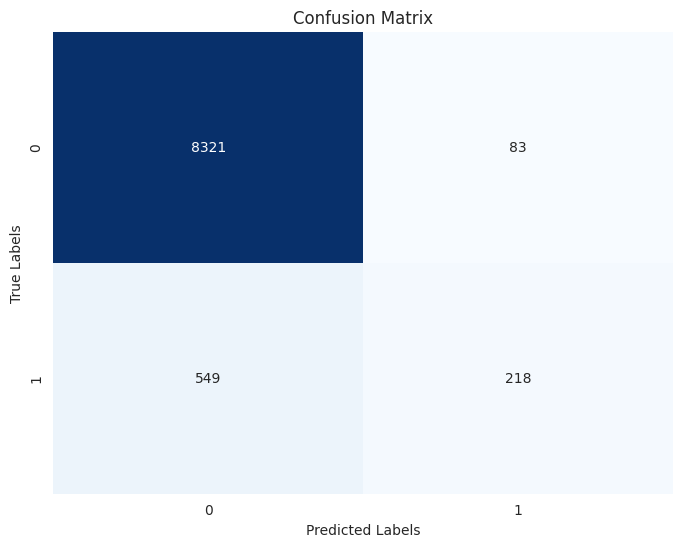

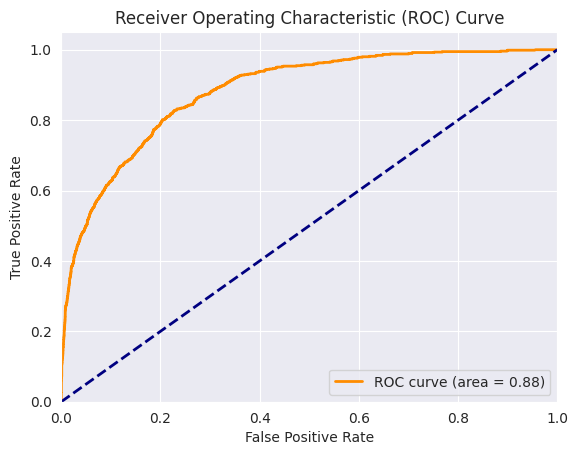

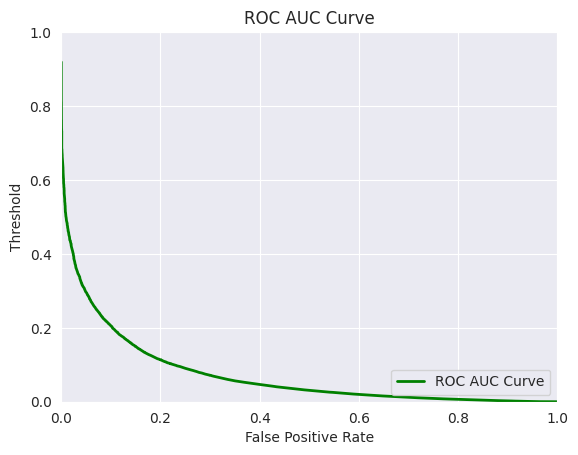

In [51]:
# Create RandomForestClassifier
rf_model = RandomForestClassifier()

# Define the hyperparameters to tune
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Evaluate the model with best hyperparameters
best_rf_model = grid_search.best_estimator_
y_pred = best_rf_model.predict(X_test)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_rf_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")
plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96      8422
           1       0.72      0.27      0.40       750

    accuracy                           0.93      9172
   macro avg       0.83      0.63      0.68      9172
weighted avg       0.92      0.93      0.92      9172

Confusion Matrix:
[[8342   80]
 [ 545  205]]


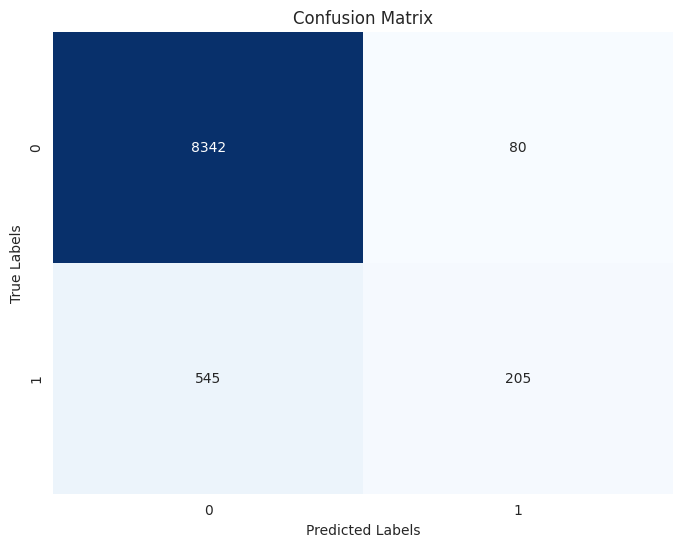

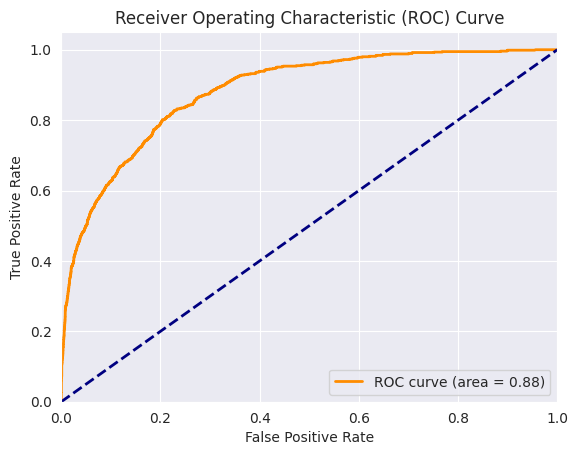

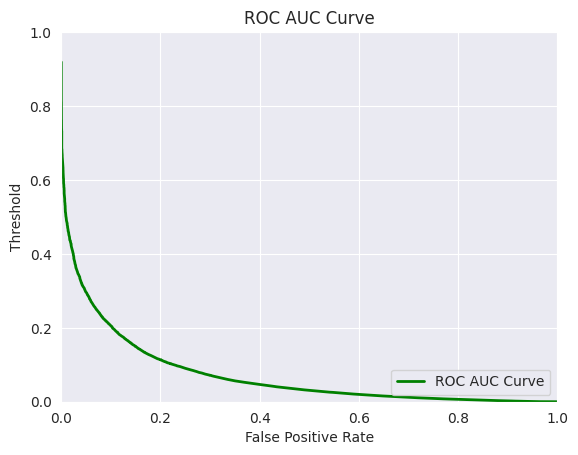

In [52]:
# Validation of the Random Forest Model

# Evaluate the model with best hyperparameters
best_rf_model = grid_search.best_estimator_
y_pred = best_rf_model.predict(X_val)

# Classification Report
print("Classification Report:")
print(classification_report(y_val, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_val, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_rf_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()

#### Logistic Regression

/home/ubuntu/.virtualenvs/Machine_Laerning/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/ubuntu/.virtualenvs/Machine_Laerning/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/ubuntu/.virtualenvs/Machine_Laerning/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/ubuntu/.virtualenvs/Machine_Laerning/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/ubuntu/.virtualenvs/Machine_Laerning/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_

Best Hyperparameters: {'C': 10, 'penalty': 'l1', 'solver': 'liblinear'}
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96      8404
           1       0.65      0.27      0.38       767

    accuracy                           0.93      9171
   macro avg       0.79      0.63      0.67      9171
weighted avg       0.91      0.93      0.91      9171

Confusion Matrix:
[[8292  112]
 [ 562  205]]


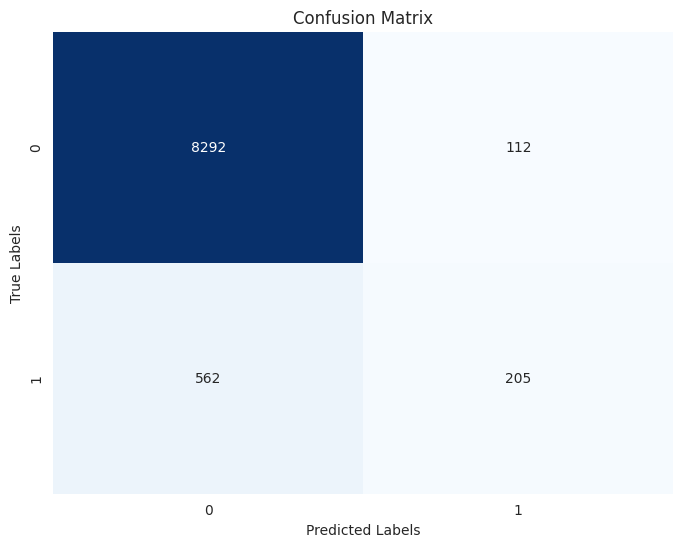

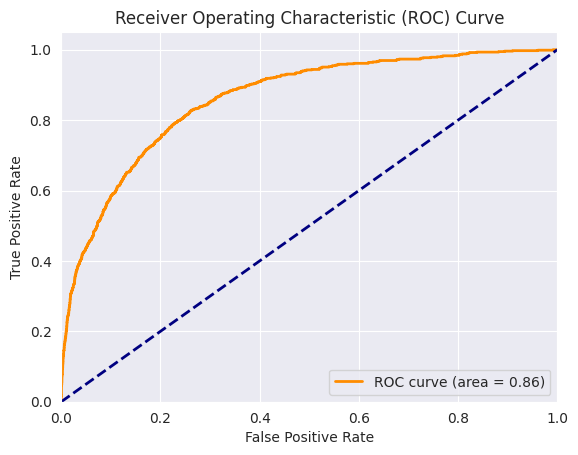

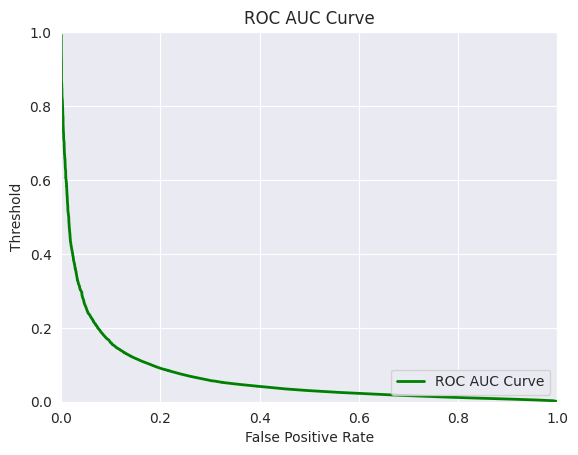

In [53]:
# Define the Logistic Regression model
lr_model = LogisticRegression()

# Define the hyperparameters to tune
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

# GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=lr_model, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Evaluate the model with best hyperparameters
best_lr_model = grid_search.best_estimator_
y_pred = best_lr_model.predict(X_test)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_lr_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96      8422
           1       0.60      0.25      0.35       750

    accuracy                           0.93      9172
   macro avg       0.77      0.62      0.66      9172
weighted avg       0.91      0.93      0.91      9172

Confusion Matrix:
[[8298  124]
 [ 562  188]]


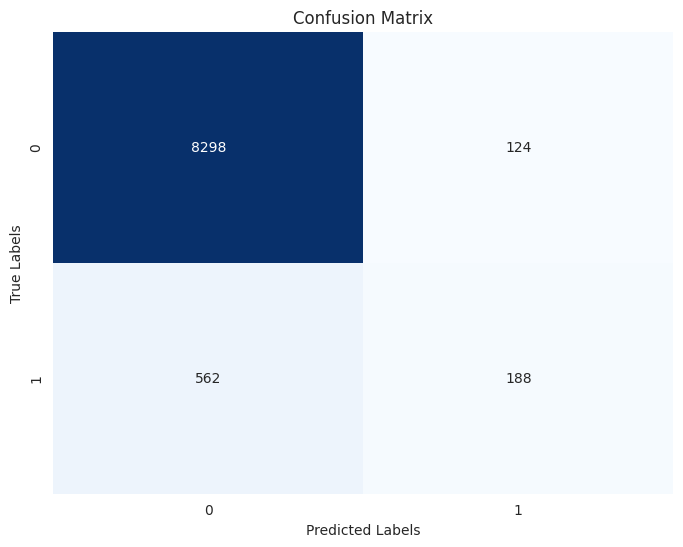

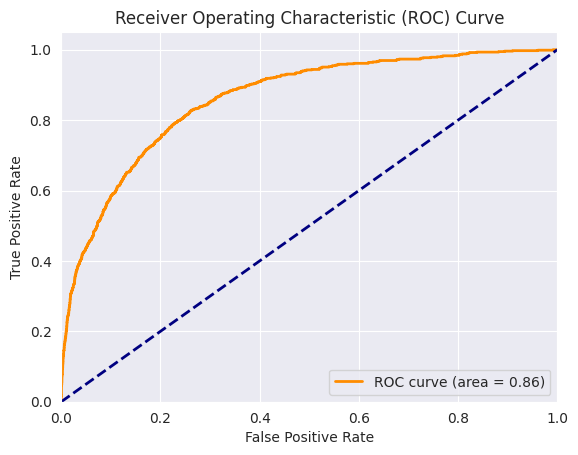

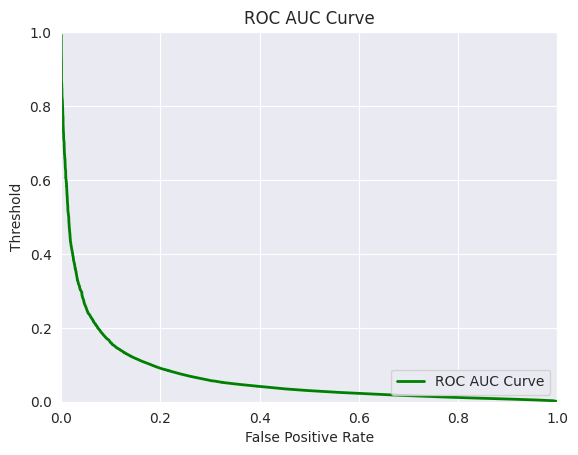

In [54]:
# Validation of the Logistic Regression Model

# Evaluate the model with best hyperparameters
best_lr_model = grid_search.best_estimator_
y_pred = best_lr_model.predict(X_val)

# Classification Report
print("Classification Report:")
print(classification_report(y_val, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_val, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_lr_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()

#### XGBoost

Best Hyperparameters: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300, 'subsample': 0.75}
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96      8404
           1       0.70      0.35      0.46       767

    accuracy                           0.93      9171
   macro avg       0.82      0.67      0.71      9171
weighted avg       0.92      0.93      0.92      9171

Confusion Matrix:
[[8289  115]
 [ 501  266]]


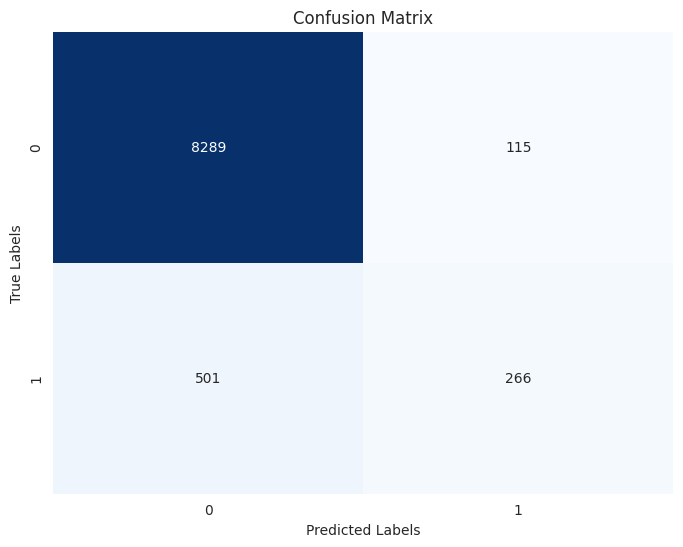

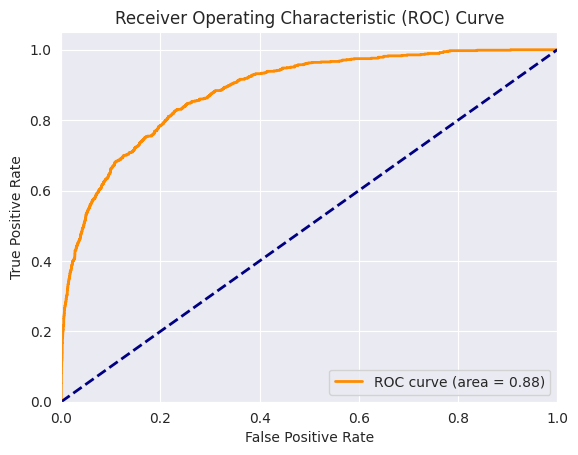

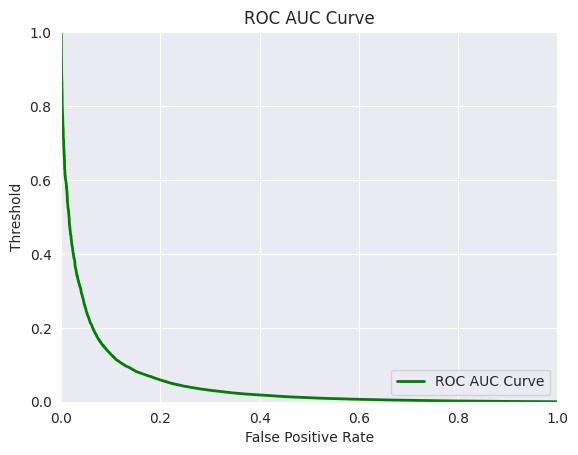

In [55]:
# Create XGBClassifier
xgb_model = XGBClassifier()

# Define the hyperparameters to tune
param_grid = {
    'n_estimators': [300, 500],
    'max_depth': [7, 10],
    'learning_rate': [0.1, 0.01],
    'subsample': [0.75, 1.0],
    'colsample_bytree': [1.0, 1.5]
}

# GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Evaluate the model with best hyperparameters
best_xgb_model = grid_search.best_estimator_
y_pred = best_xgb_model.predict(X_test)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_xgb_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      8422
           1       0.66      0.35      0.46       750

    accuracy                           0.93      9172
   macro avg       0.80      0.67      0.71      9172
weighted avg       0.92      0.93      0.92      9172

Confusion Matrix:
[[8290  132]
 [ 490  260]]


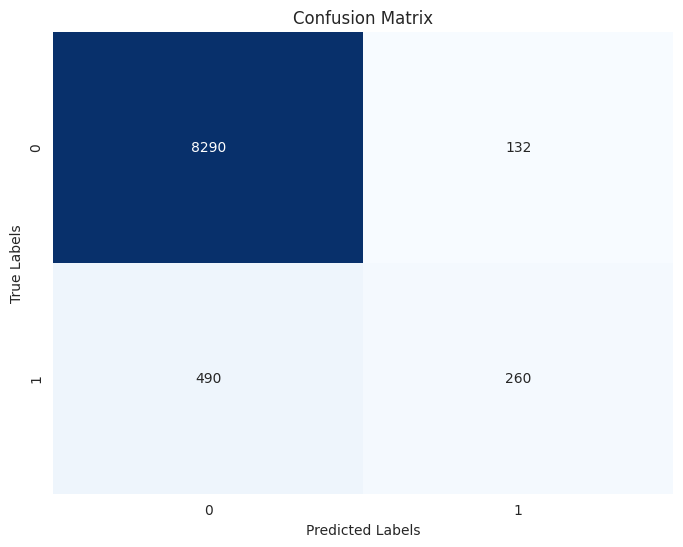

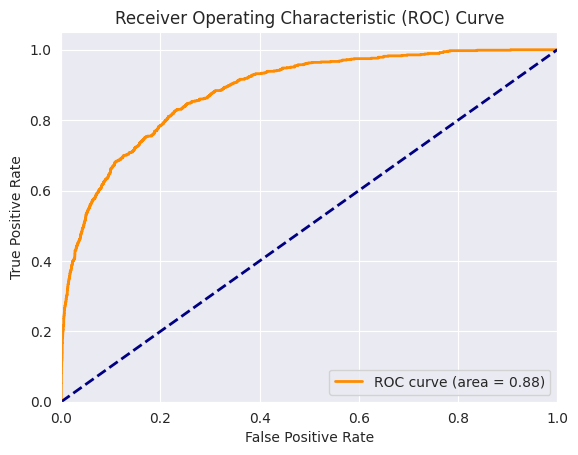

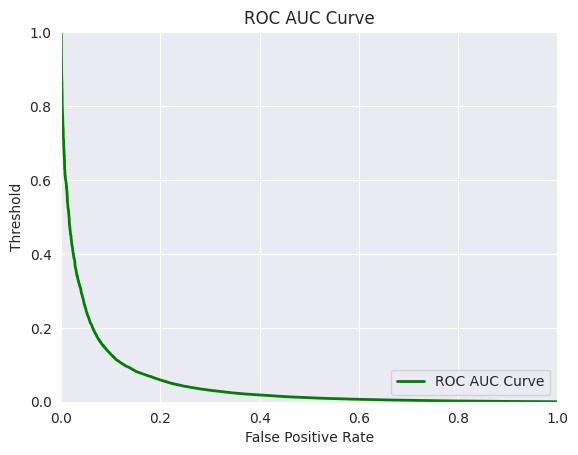

In [56]:
# Validation of the XGboost Regression Model

# Evaluate the model with best hyperparameters
best_xgb_model = grid_search.best_estimator_
y_pred = best_xgb_model.predict(X_val)

# Classification Report
print("Classification Report:")
print(classification_report(y_val, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_val, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_xgb_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()

## SMOTE Data Models

In [57]:
# Splitting the data into features and target
X = df_clean.drop("hospital_death", axis=1)
y = df_clean['hospital_death']

smote = SMOTE(random_state=500)
X, y = smote.fit_resample(X, y)

# Splitting the data into train and test set
X_train, X_test_temp, y_train, y_test_temp = train_test_split(X, y, test_size=0.2, random_state=500)
X_test, X_val, y_test, y_val = train_test_split(X_test_temp, y_test_temp, test_size=0.5, random_state=500)

print("Training set shape:", X_train.shape, y_train.shape)
print("Testing set shape:", X_test.shape, y_test.shape)
print("Validation set shape:", X_val.shape, y_val.shape)

Training set shape: (134076, 79) (134076,)
Testing set shape: (16760, 79) (16760,)
Validation set shape: (16760, 79) (16760,)


#### Random Forest

Best Hyperparameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      8373
           1       0.95      0.97      0.96      8387

    accuracy                           0.96     16760
   macro avg       0.96      0.96      0.96     16760
weighted avg       0.96      0.96      0.96     16760

Confusion Matrix:
[[7978  395]
 [ 241 8146]]


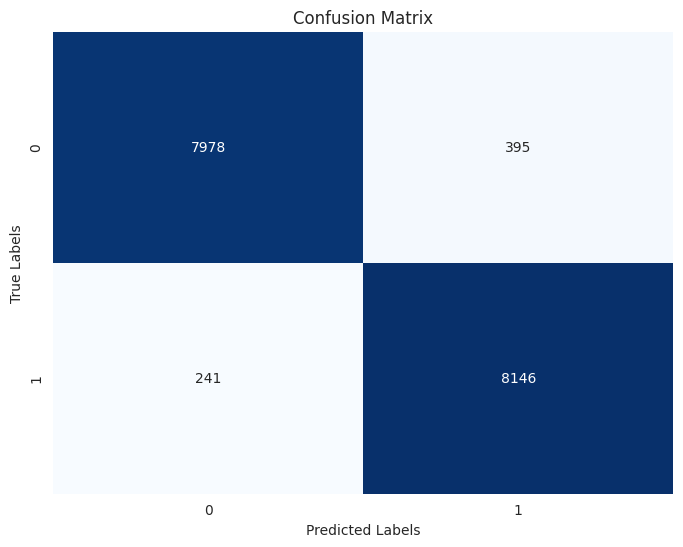

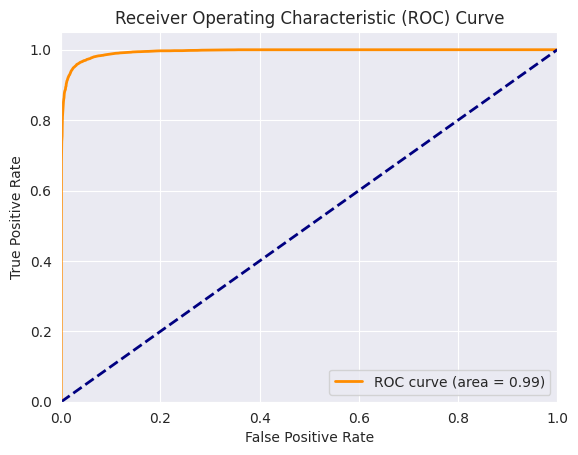

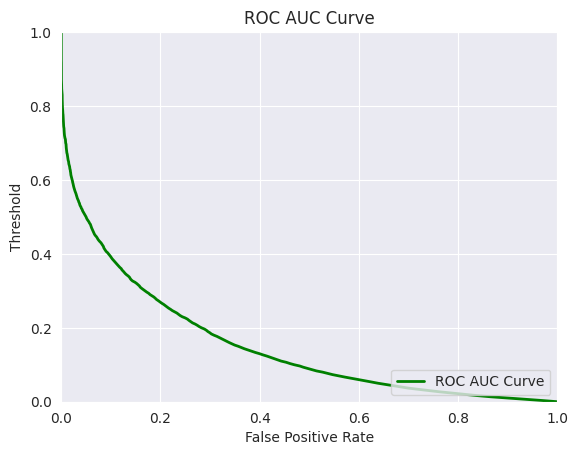

In [58]:
# Ignore all warnings
warnings.filterwarnings("ignore")

# Create RandomForestClassifier
rf_model = RandomForestClassifier()

# Define the hyperparameters to tune
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Evaluate the model with best hyperparameters
best_rf_model = grid_search.best_estimator_
y_pred = best_rf_model.predict(X_test)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_rf_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      8439
           1       0.95      0.97      0.96      8321

    accuracy                           0.96     16760
   macro avg       0.96      0.96      0.96     16760
weighted avg       0.96      0.96      0.96     16760

Confusion Matrix:
[[8029  410]
 [ 252 8069]]


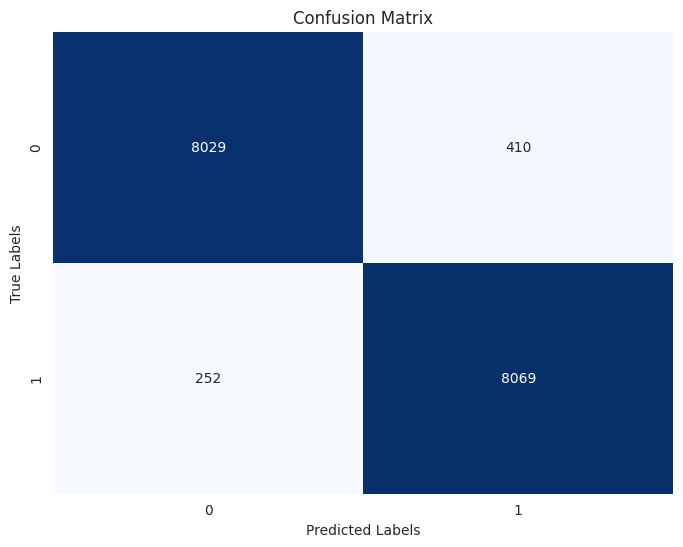

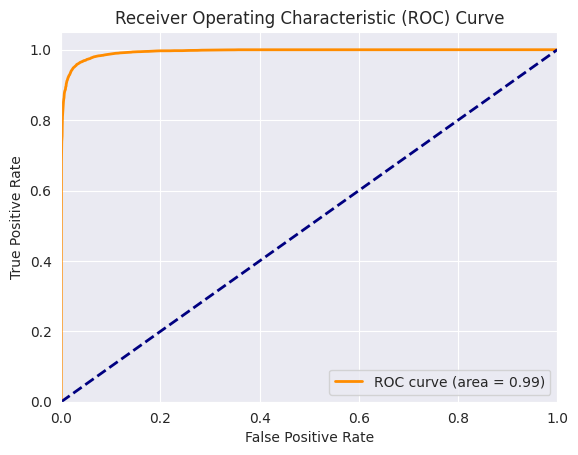

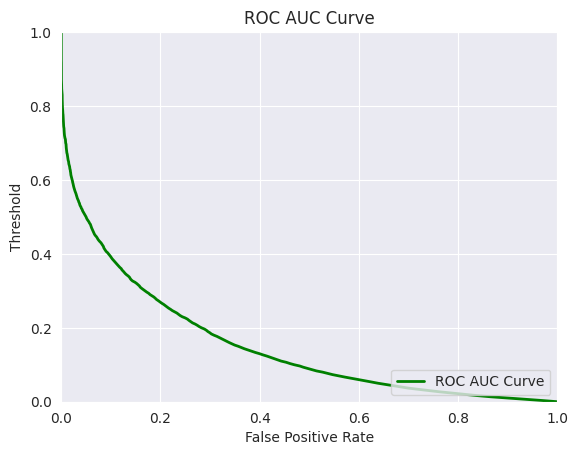

In [59]:
# Validation of the Random Forest Model

# Evaluate the model with best hyperparameters
best_rf_model = grid_search.best_estimator_
y_pred = best_rf_model.predict(X_val)

# Classification Report
print("Classification Report:")
print(classification_report(y_val, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_val, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_rf_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()

#### Logistic Regression

/home/ubuntu/.virtualenvs/Machine_Laerning/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/ubuntu/.virtualenvs/Machine_Laerning/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/ubuntu/.virtualenvs/Machine_Laerning/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/ubuntu/.virtualenvs/Machine_Laerning/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/ubuntu/.virtualenvs/Machine_Laerning/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_

Best Hyperparameters: {'C': 0.001, 'penalty': 'l2', 'solver': 'liblinear'}
Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.78      0.78      8373
           1       0.78      0.79      0.78      8387

    accuracy                           0.78     16760
   macro avg       0.78      0.78      0.78     16760
weighted avg       0.78      0.78      0.78     16760

Confusion Matrix:
[[6561 1812]
 [1802 6585]]


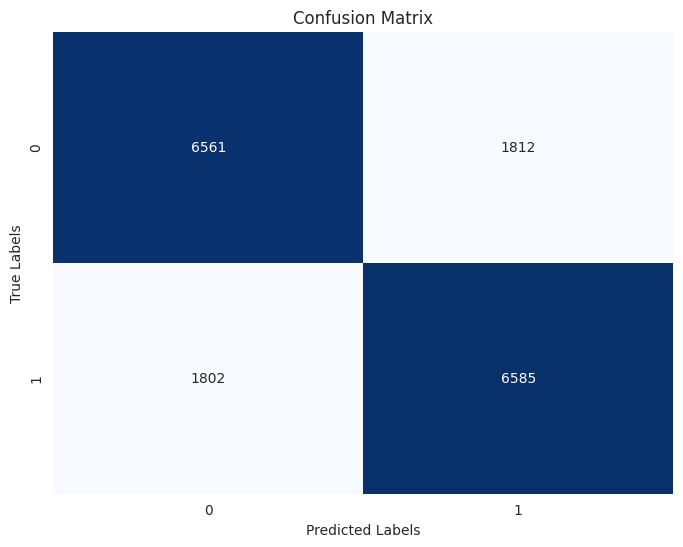

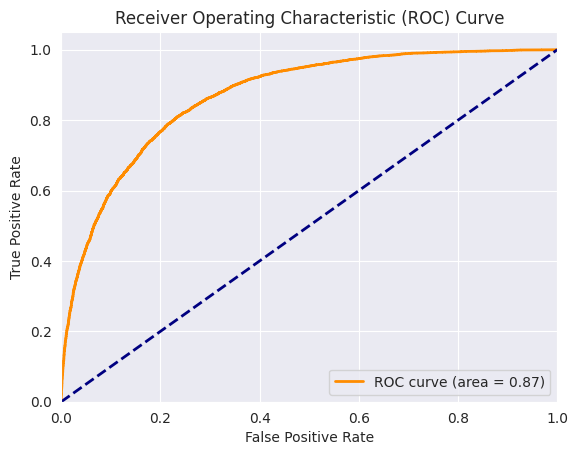

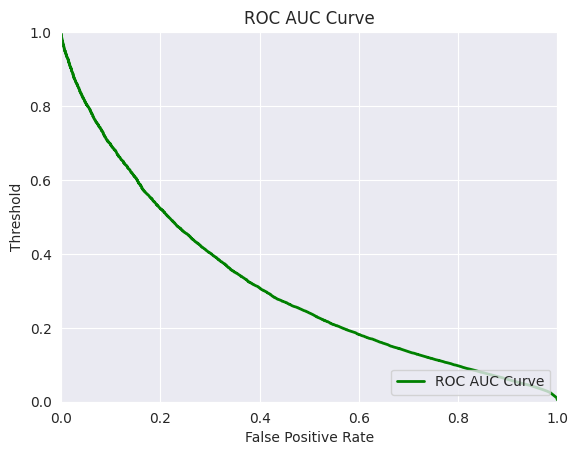

In [60]:
# Ignore all warnings
warnings.filterwarnings("ignore")

# Define the Logistic Regression model
lr_model = LogisticRegression()

# Define the hyperparameters to tune
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

# GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=lr_model, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Evaluate the model with best hyperparameters
best_lr_model = grid_search.best_estimator_
y_pred = best_lr_model.predict(X_test)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_lr_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()


Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.78      0.79      8439
           1       0.78      0.79      0.79      8321

    accuracy                           0.79     16760
   macro avg       0.79      0.79      0.79     16760
weighted avg       0.79      0.79      0.79     16760

Confusion Matrix:
[[6615 1824]
 [1755 6566]]


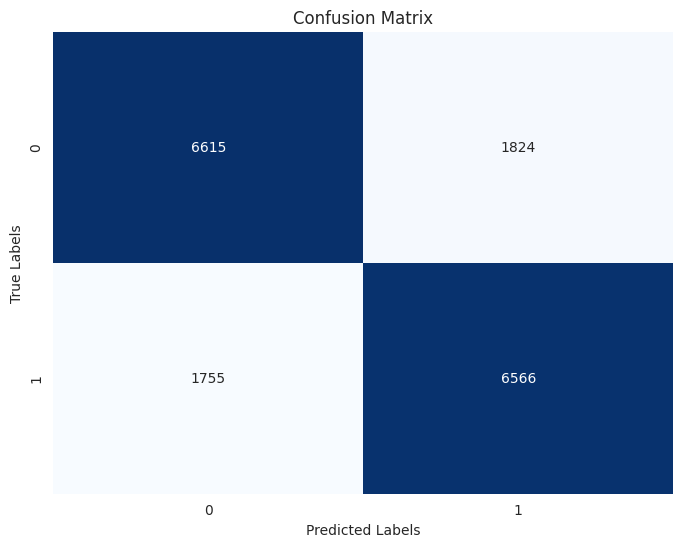

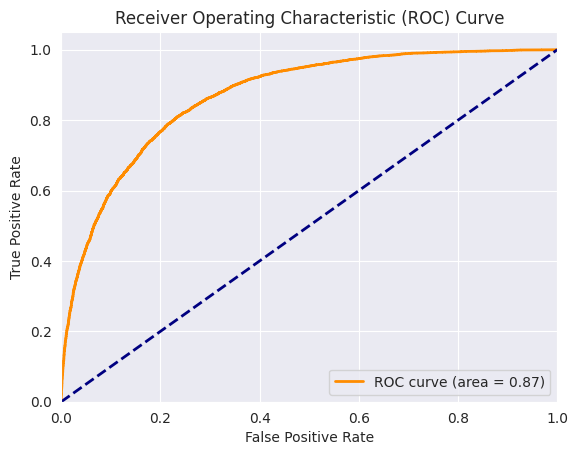

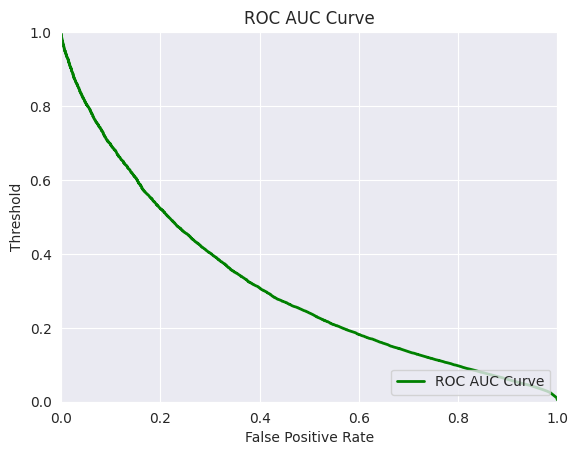

In [61]:
# Validation of the Logistic Regression Model

# Evaluate the model with best hyperparameters
best_lr_model = grid_search.best_estimator_
y_pred = best_lr_model.predict(X_val)

# Classification Report
print("Classification Report:")
print(classification_report(y_val, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_val, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_lr_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()

#### XGBoost

Best Hyperparameters: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 500, 'subsample': 1.0}
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      8373
           1       0.98      0.94      0.96      8387

    accuracy                           0.96     16760
   macro avg       0.96      0.96      0.96     16760
weighted avg       0.96      0.96      0.96     16760

Confusion Matrix:
[[8229  144]
 [ 503 7884]]


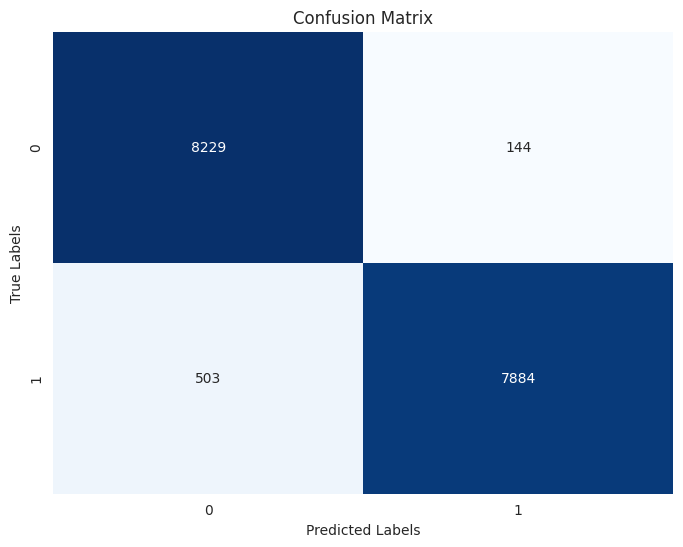

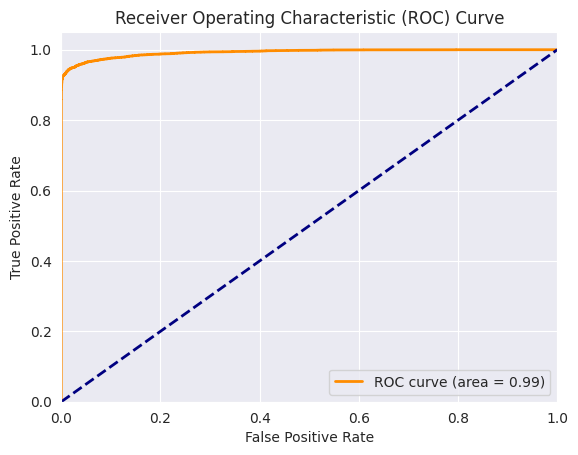

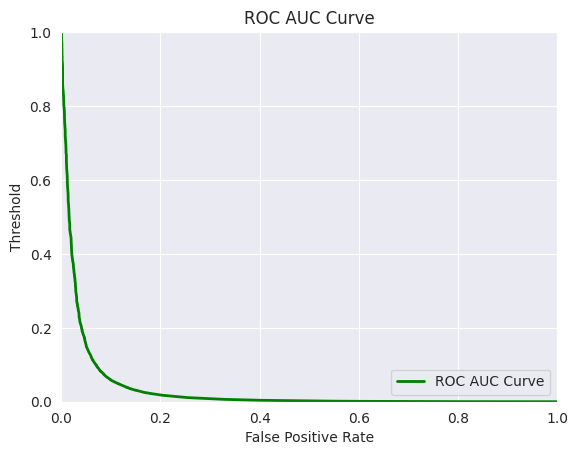

In [62]:
# Ignore all warnings
warnings.filterwarnings("ignore")

# Create XGBClassifier
xgb_model = XGBClassifier()

# Define the hyperparameters to tune
param_grid = {
    'n_estimators': [300, 500],
    'max_depth': [7, 10],
    'learning_rate': [0.1, 0.01],
    'subsample': [0.75, 1.0],
    'colsample_bytree': [1.0, 1.5]
}

# GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Evaluate the model with best hyperparameters
best_xgb_model = grid_search.best_estimator_
y_pred = best_xgb_model.predict(X_test)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_xgb_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.97      8439
           1       0.98      0.94      0.96      8321

    accuracy                           0.96     16760
   macro avg       0.97      0.96      0.96     16760
weighted avg       0.96      0.96      0.96     16760

Confusion Matrix:
[[8305  134]
 [ 465 7856]]


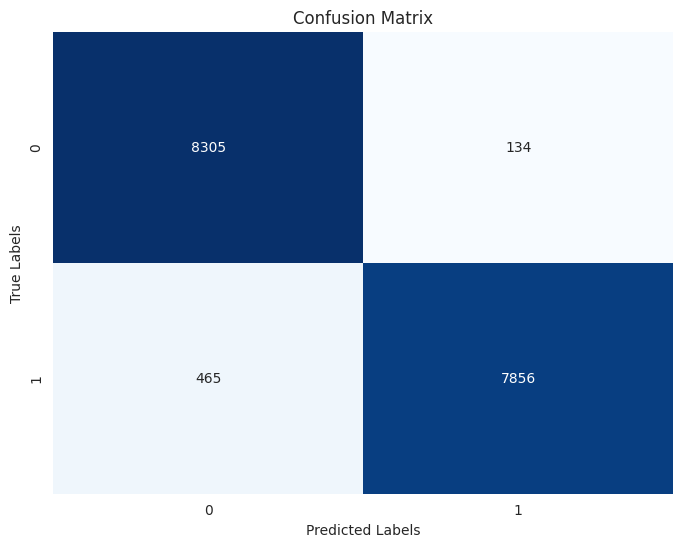

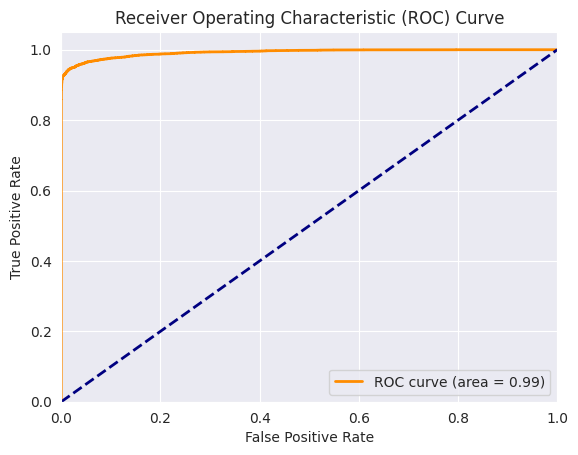

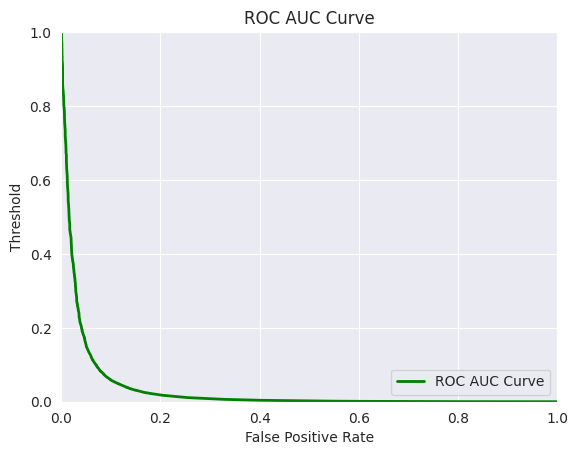

In [63]:
# Validation of the XGboost Regression Model

# Evaluate the model with best hyperparameters
best_xgb_model = grid_search.best_estimator_
y_pred = best_xgb_model.predict(X_val)

# Classification Report
print("Classification Report:")
print(classification_report(y_val, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_val, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_xgb_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()

## PCA Models

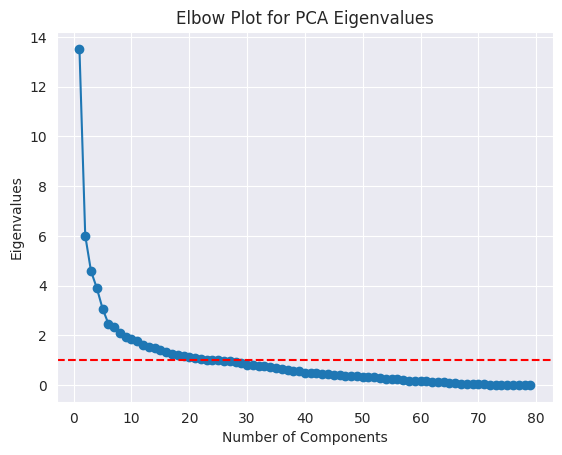

Index(['age', 'bmi', 'elective_surgery', 'ethnicity', 'gender', 'height',
       'icu_admit_source', 'icu_stay_type', 'icu_type', 'pre_icu_los_days',
       'weight', 'apache_2_diagnosis', 'apache_3j_diagnosis',
       'apache_post_operative', 'arf_apache', 'gcs_eyes_apache',
       'gcs_motor_apache', 'gcs_unable_apache', 'gcs_verbal_apache',
       'heart_rate_apache', 'intubated_apache', 'map_apache',
       'resprate_apache', 'temp_apache'],
      dtype='object')


In [64]:
# PCA

X = df_clean.drop("hospital_death", axis=1)
y = df_clean['hospital_death']

# Perform PCA
pca = PCA()
pca.fit(X)

# Get eigenvalues
eigenvalues = pca.explained_variance_

# Find columns with eigenvalues > 1
selected_columns_names = X.columns[pca.explained_variance_ > 1]

# Elbow plot
plt.plot(range(1, len(eigenvalues) + 1), eigenvalues, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Eigenvalues')
plt.title('Elbow Plot for PCA Eigenvalues')
plt.axhline(y=1, color='r', linestyle='--')
plt.show()

print(selected_columns_names)

#### PreProcessing

In [65]:
# Splitting the data into features and target
X_new = df_clean[selected_columns_names]
y_new = df_clean['hospital_death']

smote = SMOTE(random_state=500)
X_new, y_new = smote.fit_resample(X_new, y_new)

# Splitting the data into train and test set
X_train, X_test_temp, y_train, y_test_temp = train_test_split(X_new, y_new, test_size=0.2, random_state=500)
X_test, X_val, y_test, y_val = train_test_split(X_test_temp, y_test_temp, test_size=0.5, random_state=500)

print("Training set shape:", X_train.shape, y_train.shape)
print("Testing set shape:", X_test.shape, y_test.shape)
print("Validation set shape:", X_val.shape, y_val.shape)

Training set shape: (134076, 24) (134076,)
Testing set shape: (16760, 24) (16760,)
Validation set shape: (16760, 24) (16760,)


#### Random Forest

Best Hyperparameters: {'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.96      8373
           1       0.96      0.95      0.96      8387

    accuracy                           0.96     16760
   macro avg       0.96      0.96      0.96     16760
weighted avg       0.96      0.96      0.96     16760

Confusion Matrix:
[[8045  328]
 [ 382 8005]]


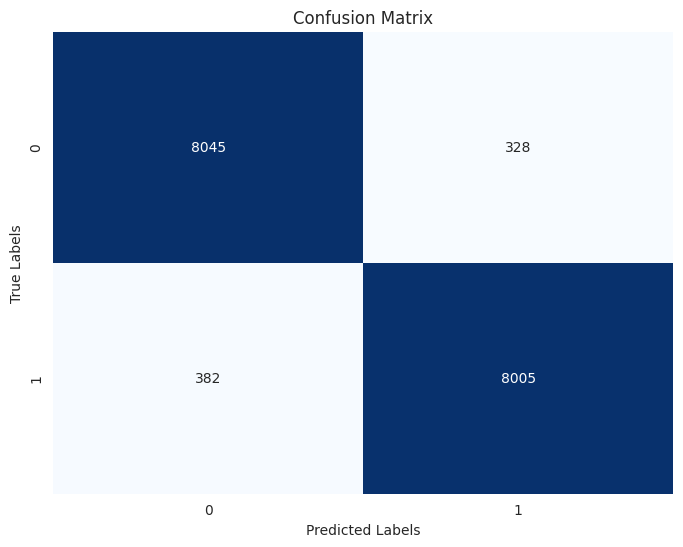

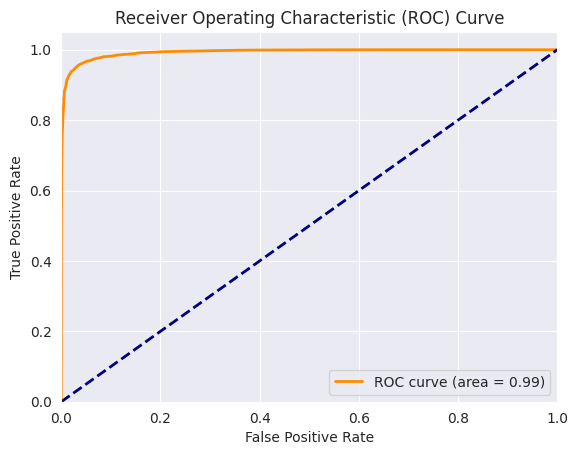

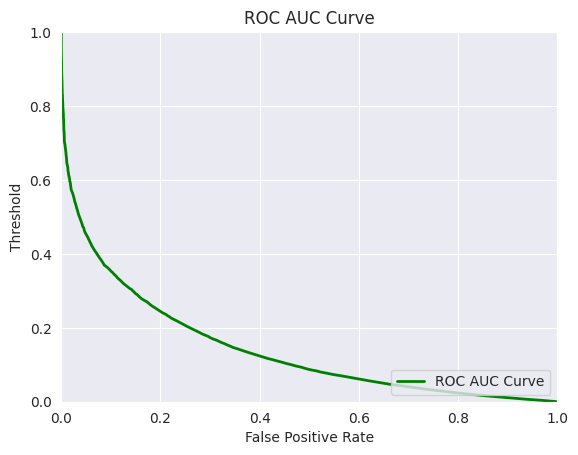

In [66]:
# Ignore all warnings
warnings.filterwarnings("ignore")

# Create RandomForestClassifier
rf_model = RandomForestClassifier()

# Define the hyperparameters to tune
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Evaluate the model with best hyperparameters
best_rf_model = grid_search.best_estimator_
y_pred = best_rf_model.predict(X_test)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_rf_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      8439
           1       0.96      0.96      0.96      8321

    accuracy                           0.96     16760
   macro avg       0.96      0.96      0.96     16760
weighted avg       0.96      0.96      0.96     16760

Confusion Matrix:
[[8137  302]
 [ 359 7962]]


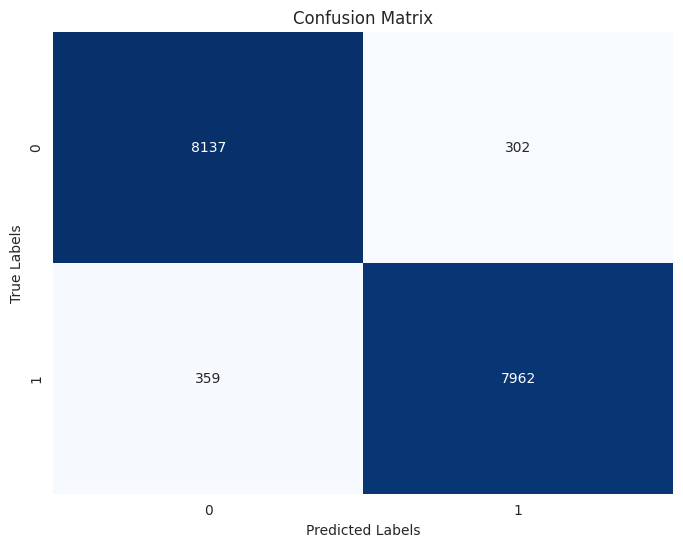

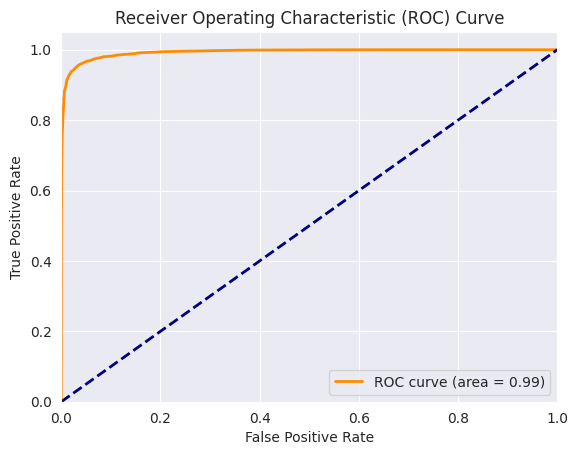

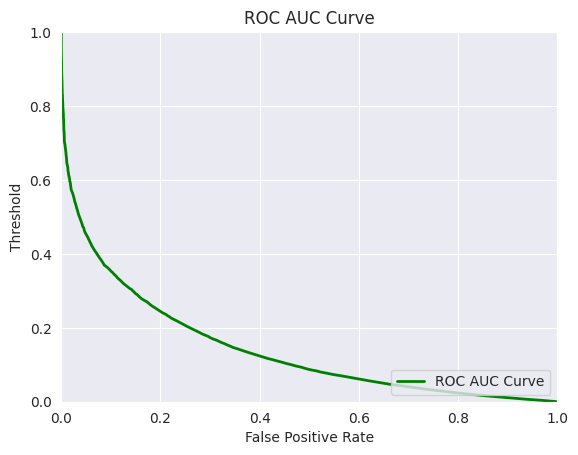

In [67]:
# Validation of the Random Forest Model

# Evaluate the model with best hyperparameters
best_rf_model = grid_search.best_estimator_
y_pred = best_rf_model.predict(X_val)

# Classification Report
print("Classification Report:")
print(classification_report(y_val, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_val, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_rf_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()

#### Logistic Regression

Best Hyperparameters: {'C': 0.001, 'penalty': 'l2', 'solver': 'liblinear'}
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.75      0.74      8373
           1       0.75      0.74      0.74      8387

    accuracy                           0.74     16760
   macro avg       0.74      0.74      0.74     16760
weighted avg       0.74      0.74      0.74     16760

Confusion Matrix:
[[6277 2096]
 [2214 6173]]


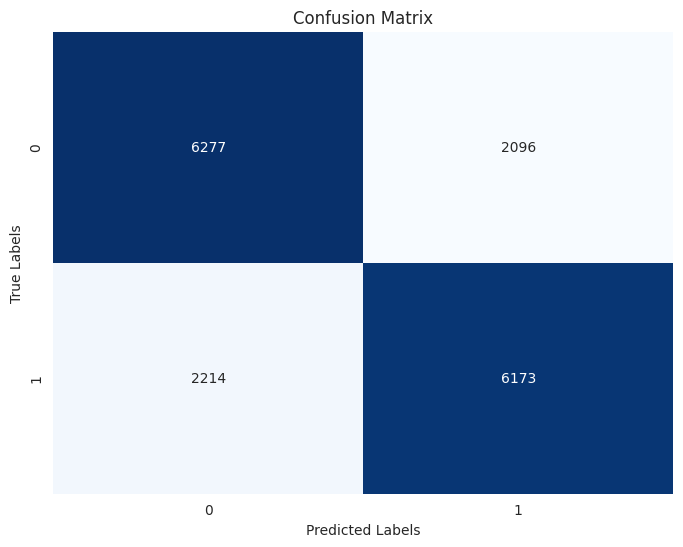

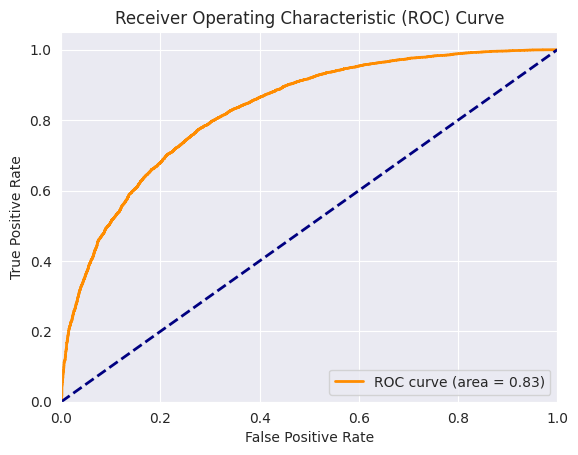

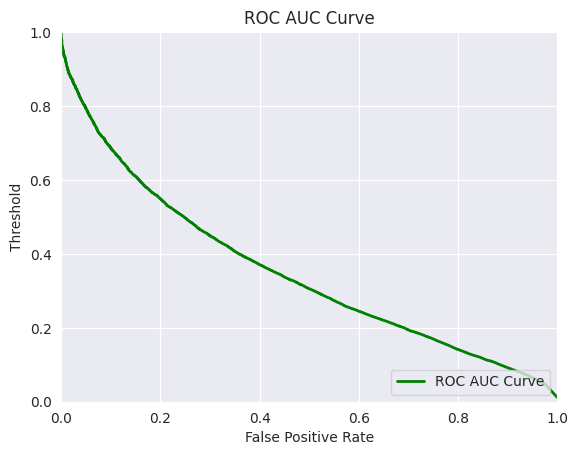

In [68]:
# Ignore all warnings
warnings.filterwarnings("ignore")

# Define the Logistic Regression model
lr_model = LogisticRegression()

# Define the hyperparameters to tune
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

# GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=lr_model, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Evaluate the model with best hyperparameters
best_lr_model = grid_search.best_estimator_
y_pred = best_lr_model.predict(X_test)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_lr_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.75      0.75      8439
           1       0.75      0.74      0.74      8321

    accuracy                           0.75     16760
   macro avg       0.75      0.75      0.75     16760
weighted avg       0.75      0.75      0.75     16760

Confusion Matrix:
[[6351 2088]
 [2183 6138]]


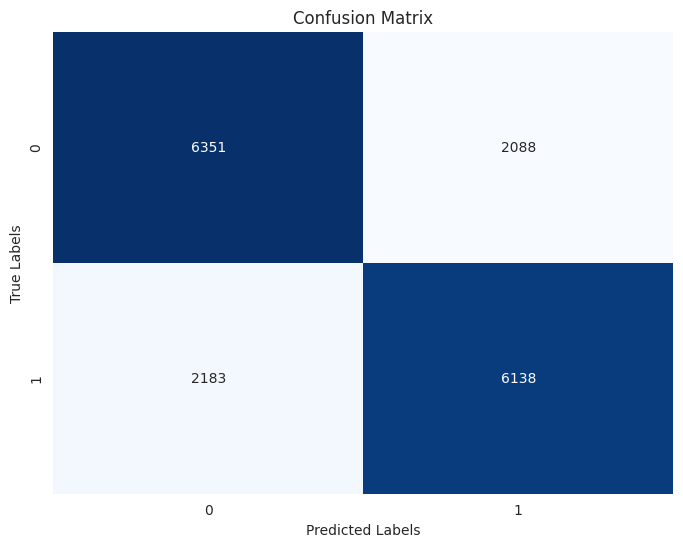

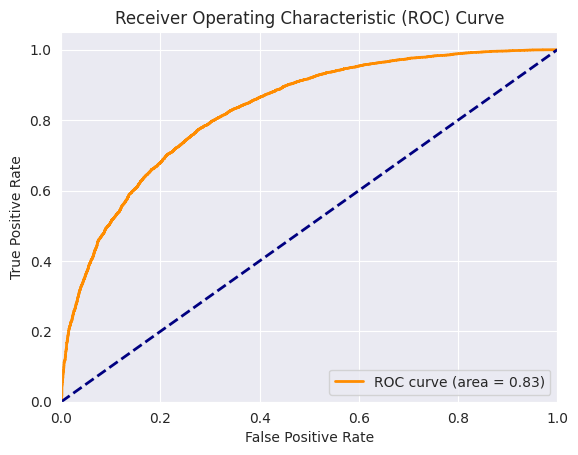

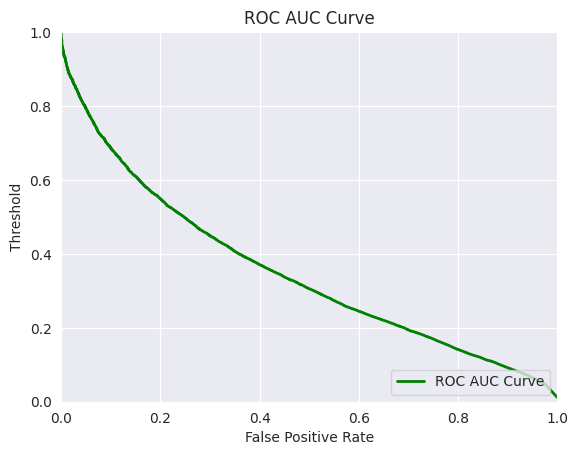

In [69]:
# Validation of the Logistic Regression Model

# Evaluate the model with best hyperparameters
best_lr_model = grid_search.best_estimator_
y_pred = best_lr_model.predict(X_val)

# Classification Report
print("Classification Report:")
print(classification_report(y_val, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_val, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_lr_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()

#### XGBoost

Best Hyperparameters: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 500, 'subsample': 0.75}
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      8373
           1       0.98      0.93      0.96      8387

    accuracy                           0.96     16760
   macro avg       0.96      0.96      0.96     16760
weighted avg       0.96      0.96      0.96     16760

Confusion Matrix:
[[8209  164]
 [ 556 7831]]


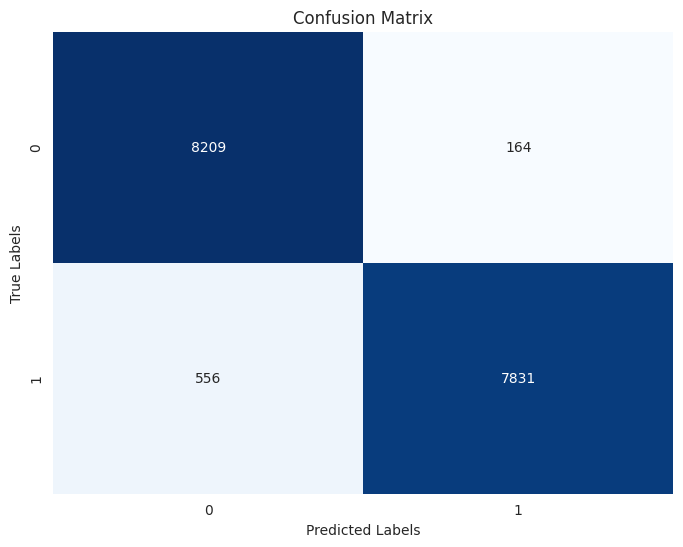

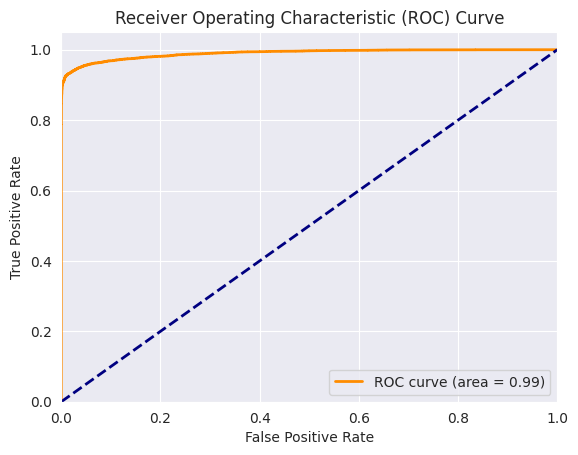

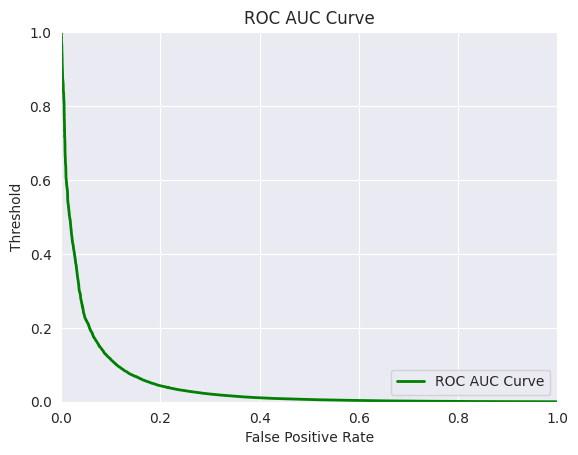

In [70]:
# Ignore all warnings
warnings.filterwarnings("ignore")

# Create XGBClassifier
xgb_model = XGBClassifier()

# Define the hyperparameters to tune
param_grid = {
    'n_estimators': [300, 500],
    'max_depth': [7, 10],
    'learning_rate': [0.1, 0.01],
    'subsample': [0.75, 1.0],
    'colsample_bytree': [1.0, 1.5]
}

# GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Evaluate the model with best hyperparameters
best_xgb_model = grid_search.best_estimator_
y_pred = best_xgb_model.predict(X_test)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_xgb_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()


Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      8439
           1       0.98      0.93      0.96      8321

    accuracy                           0.96     16760
   macro avg       0.96      0.96      0.96     16760
weighted avg       0.96      0.96      0.96     16760

Confusion Matrix:
[[8299  140]
 [ 556 7765]]


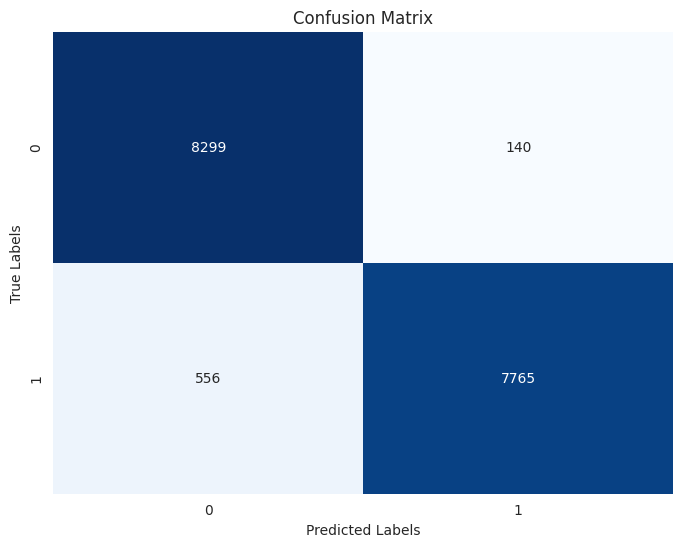

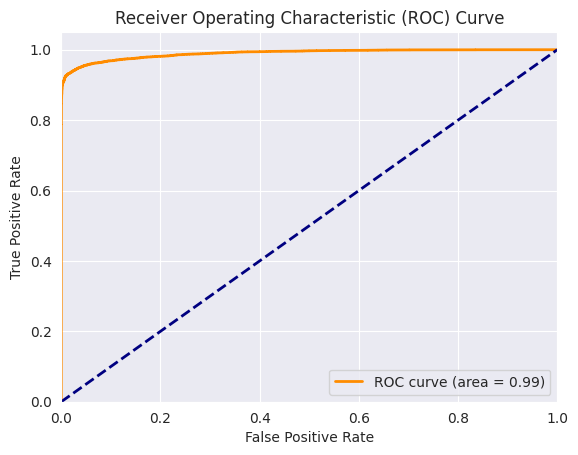

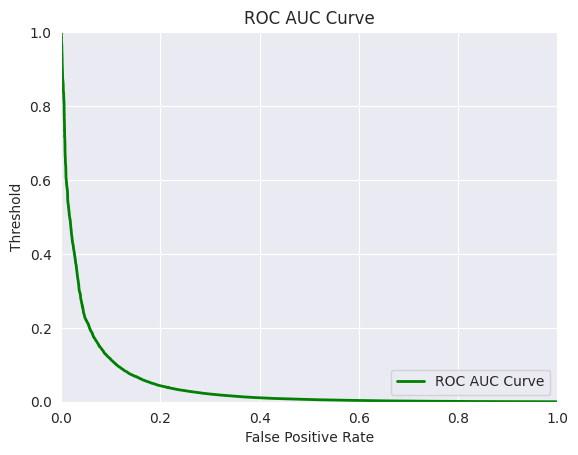

In [71]:
# Validation of the XGboost Regression Model

# Evaluate the model with best hyperparameters
best_xgb_model = grid_search.best_estimator_
y_pred = best_xgb_model.predict(X_val)

# Classification Report
print("Classification Report:")
print(classification_report(y_val, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_val, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Compute predicted probabilities and true labels
y_pred_proba = best_xgb_model.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_val, y_pred_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

# Plot ROC AUC curve
plt.figure()
plt.plot(fpr, thresholds, color='green', lw=2, label='ROC AUC Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('Threshold')
plt.title('ROC AUC Curve')
plt.legend(loc="lower right")

plt.show()